In [1]:
import re
import os 

from os import listdir
from os.path import isfile, join
import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage import io

from pathlib import Path
from tqdm.notebook import trange, tqdm
from joblib import Parallel, delayed
import re
from skimage import exposure
import h5py
import pandas as pd

In [2]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / 'data' 

In [135]:
donors = [
    "LN Donor A",
    "LN Donor E",
    "INT Donor B",
    "INT Donor E",
    "TS Donor A",
    "TS Donor E",
]

donor = donors[4]

# Import data

In [149]:
h5_data = p_dir / 'data' / 'h5' / f'{donor}.hdf5'

def get_imgs(file_path, name):
    f = h5py.File(file_path, 'r')
    imgs = f[name]
    labels = list(f[name].attrs['labels'])
    return imgs, labels

def contrast_stretching(img):
    # Contrast stretching
    p2, p98 = np.percentile(img, (1, 95))
    img_rescale = exposure.rescale_intensity(
        img, in_range=(p2, p98), out_range=(0, 255)
    ).astype(np.uint8)
    return img_rescale


In [150]:
df = pd.read_csv(data_dir / 'metadata' / f"info_{donor}.csv")
ROIs = df.ROI.unique()

In [151]:
for roi in ROIs:
    imgs, markers = get_imgs(h5_data, str(roi))
    break

In [152]:
# import napari 
# imgs, markers = get_imgs(h5_data, str(1))
# viewer = napari.view_image(np.stack(imgs), channel_axis=0, name=markers)

In [161]:
imgs_dapi = []

subset = ["DNA1", "DNA2", 'H3K27me3', 'Ki67', 'C-Myc']
# subset = ["DNA1", "DNA2", 'Ki67']
# subset = ["DNA1", "DNA2"]

for roi in ROIs:
    imgs, markers = get_imgs(h5_data, str(roi))
    img_dapi = np.max(
        contrast_stretching(imgs[sorted([markers.index(marker) for marker in subset])]), axis=0
    )
    img_dapi = contrast_stretching(img_dapi)
    imgs_dapi.append(img_dapi)

In [163]:
import napari

napari.view_image(np.stack(imgs_dapi))

C:\Users\thu71\.conda\envs\WSI\lib\site-packages\napari\_vispy\vispy_camera.py:109: RuntimeWarning: divide by zero encountered in true_divide
  zoom = np.min(canvas_size / scale)


Viewer(axes=Axes(visible=False, labels=True, colored=True, dashed=False, arrows=True), camera=Camera(center=(0.0, 499.5, 499.5), zoom=0.8482482482482482, angles=(0.0, 0.0, 90.0), perspective=0.0, interactive=True), cursor=Cursor(position=(0.0, 0.0, 0.0), scaled=True, size=1, style='standard'), dims=Dims(ndim=3, ndisplay=2, last_used=2, range=((0.0, 13.0, 1.0), (0.0, 999.0, 1.0), (0.0, 999.0, 1.0)), current_step=(0, 0, 0), order=(0, 1, 2), axis_labels=('0', '1', '2')), grid=GridCanvas(enabled=False, stride=1, shape=(-1, -1)), layers=[<Image layer 'Image' at 0x27ef8bde7c0>], scale_bar=ScaleBar(visible=False, colored=False, ticks=True, position='bottom_right', font_size=10.0, unit=None), text_overlay=TextOverlay(visible=False, color=array([1., 1., 1., 1.]), font_size=10.0, position='top_left', text=''), help='', status='Ready', tooltip=Tooltip(visible=False, text=''), theme='dark', title='napari', mouse_move_callbacks=[], mouse_drag_callbacks=[], mouse_wheel_callbacks=[<function dims_scro

# Segmentation

In [164]:
from cellpose import models
from cellpose import utils

In [165]:
use_GPU = models.use_gpu()
print('>>> GPU activated? %d'%use_GPU)

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=True, model_type='nuclei')

    
# Cyto segmentation
channels = [0,0]
masks, flows, styles, diams = model.eval(imgs_dapi, diameter=7, flow_threshold=6.0, cellprob_threshold=-6.0, channels = channels, resample=True)

** TORCH CUDA version installed and working. **
>>> GPU activated? 1
** TORCH CUDA version installed and working. **
>>>> using GPU
processing 14 image(s)


  0%|                                                                                           | 0/14 [00:00<?, ?it/s]C:\Users\thu71\.conda\envs\WSI\lib\site-packages\torch\nn\functional.py:3385: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "
100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [12:38<00:00, 54.15s/it]

time spent: running network 135.08s; flow+mask computation 622.72
estimated masks for 14 image(s) in 759.31 sec
>>>> TOTAL TIME 759.31 sec


# Mask viz

In [166]:
import matplotlib.colors as mcolors
from scipy.ndimage import distance_transform_edt
from skimage.segmentation import mark_boundaries

def expand_labels(label_image, distance=1):
    distances, nearest_label_coords = distance_transform_edt(
        label_image == 0, return_indices=True
    )
    labels_out = np.zeros_like(label_image)
    dilate_mask = distances <= distance
    # build the coordinates to find nearest labels,
    # in contrast to [1] this implementation supports label arrays
    # of any dimension
    masked_nearest_label_coords = [
        dimension_indices[dilate_mask]
        for dimension_indices in nearest_label_coords
    ]
    nearest_labels = label_image[tuple(masked_nearest_label_coords)]
    labels_out[dilate_mask] = nearest_labels
    return labels_out

def save_mask(mask, folder, region):
    path = os.path.join(folder, f'ROI_{region}' + ".tif")
    skimage.io.imsave(path, masks[idx])        


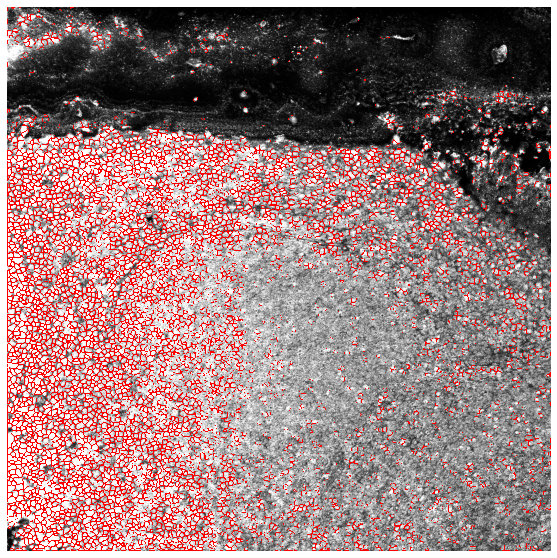

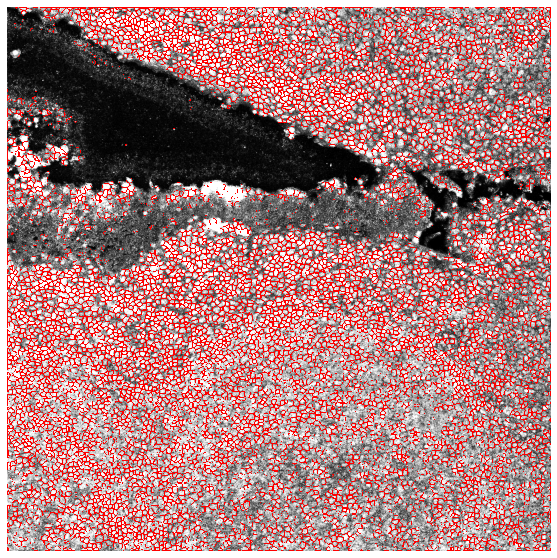

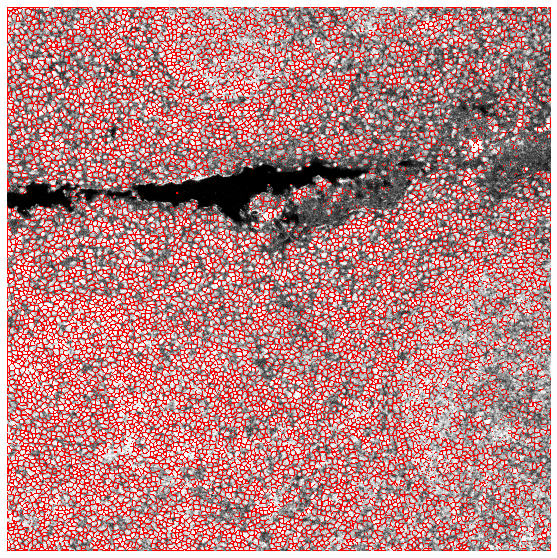

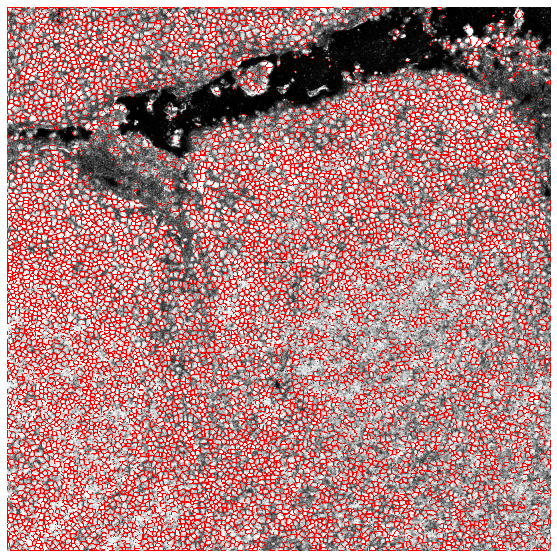

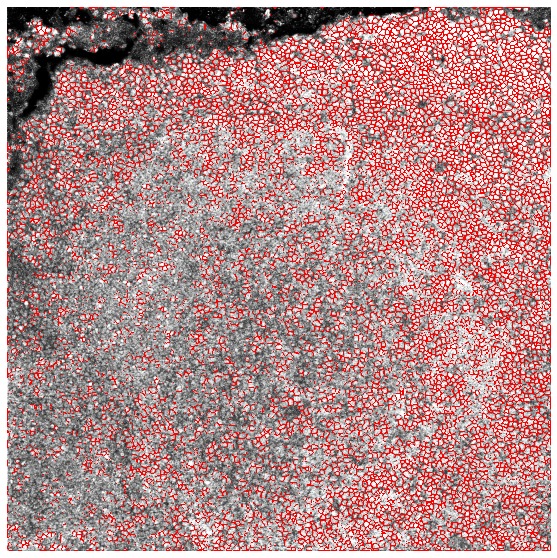

...

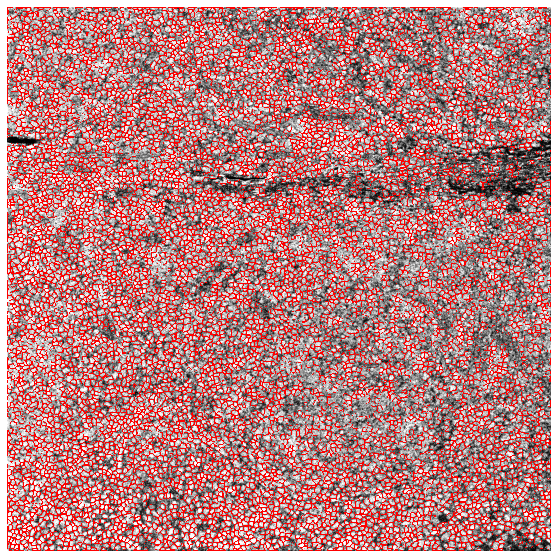

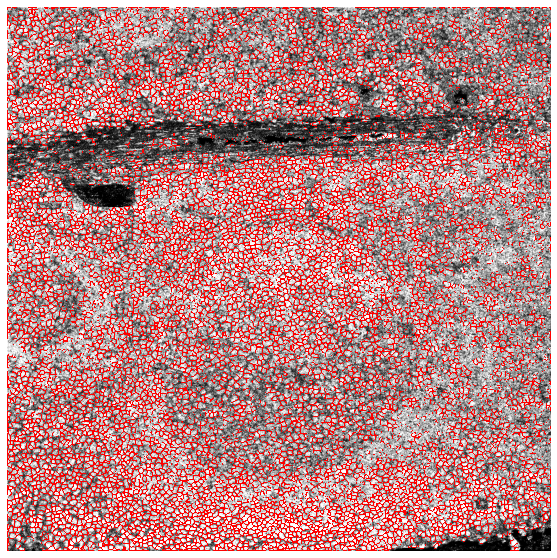

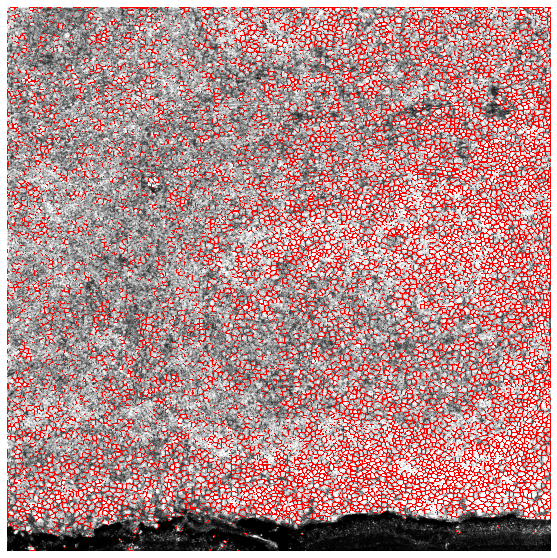

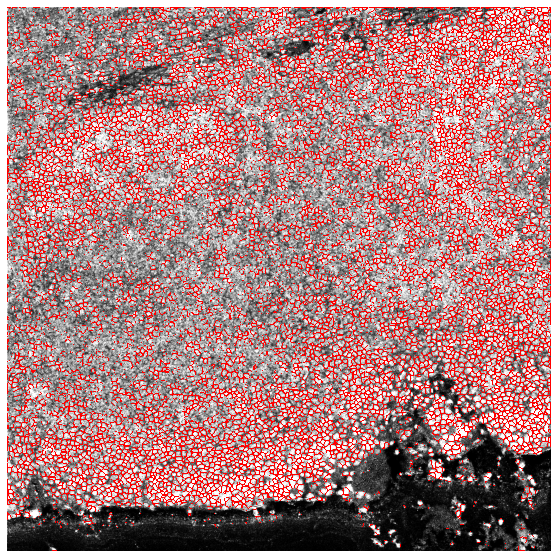

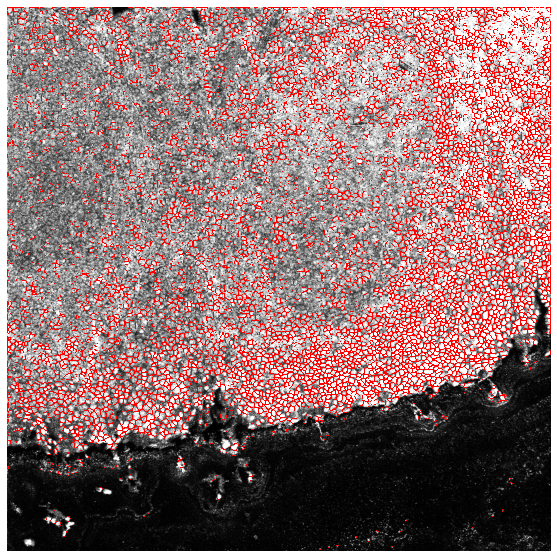

In [167]:
colors = [(1,0,0,c) for c in np.linspace(0,1,100)]
cmapred = mcolors.LinearSegmentedColormap.from_list('Reds', colors, N=2)

for idx, mask in enumerate(masks):
    outlines = utils.masks_to_outlines(mask)
    outX, outY = np.nonzero(outlines)
    imgout = np.zeros(imgs_dapi[idx].shape)
    imgout[outX, outY] = 255
    
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(imgs_dapi[idx], cmap = 'gray')
    ax.imshow(imgout, cmap=cmapred)
    ax.axis('off')
    plt.show()

In [168]:
masks_expanded = []
for mask in masks:
    masks_expanded.append(expand_labels(mask, distance=2))

In [ ]:
colors = [(1,0,0,c) for c in np.linspace(0,1,100)]
cmapred = mcolors.LinearSegmentedColormap.from_list('Reds', colors, N=2)

for idx, mask in enumerate(masks_expanded):
    outlines = utils.masks_to_outlines(mask)
    outX, outY = np.nonzero(outlines)
    imgout = np.zeros(imgs_dapi[idx].shape)
    imgout[outX, outY] = 255
    
    fig, ax = plt.subplots(figsize=(20,20))
    ax.imshow(imgs_dapi[idx], cmap = 'gray')
    ax.imshow(imgout, cmap=cmapred)
    ax.axis('off')
    plt.show()

In [106]:
if not os.path.exists(data_dir / 'masks' / donor):
    os.makedirs(data_dir / 'masks' / donor)

In [107]:
for idx, mask in enumerate(masks):
    save_mask(masks_expanded, data_dir / 'masks' / donor, ROIs[idx])

C:\Users\thu71\AppData\Local\Temp/ipykernel_42812/449303379.py:24: UserWarning: Y:\coskun-lab\Thomas\Leap\data\masks\LN Donor E\ROI_1.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
C:\Users\thu71\AppData\Local\Temp/ipykernel_42812/449303379.py:24: UserWarning: Y:\coskun-lab\Thomas\Leap\data\masks\LN Donor E\ROI_2.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
C:\Users\thu71\AppData\Local\Temp/ipykernel_42812/449303379.py:24: UserWarning: Y:\coskun-lab\Thomas\Leap\data\masks\LN Donor E\ROI_3.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
C:\Users\thu71\AppData\Local\Temp/ipykernel_42812/449303379.py:24: UserWarning: Y:\coskun-lab\Thomas\Leap\data\masks\LN Donor E\ROI_5.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
C:\Users\thu71\AppData\Local\Temp/ipykernel_42812/449303379.py:24: UserWarning: Y:\coskun-lab\Thomas\Leap\data\masks\LN Donor E\ROI_4.tif is a low contrast image
  skimage.io.imsave(path, masks[idx])
